In [1]:
#loading the data

%matplotlib inline 


from sklearn.utils import resample # useful to deal with unbalanced dataset


import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, accuracy_score, r2_score, classification_report
from sklearn.tree import DecisionTreeClassifier

import math



df = pd.read_csv('Data-Collisions.csv')



# Diplay the first 5 rows
df.info()

/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/IPython/core/interactiveshell.py:3072: DtypeWarning: Columns (34) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 194673 entries, 0 to 194672
Data columns (total 39 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   Unnamed: 0      194673 non-null  int64  
 1   SEVERITYCODE    194673 non-null  int64  
 2   X               189339 non-null  float64
 3   Y               189339 non-null  float64
 4   OBJECTID        194673 non-null  int64  
 5   INCKEY          194673 non-null  int64  
 6   COLDETKEY       194673 non-null  int64  
 7   REPORTNO        194673 non-null  object 
 8   STATUS          194673 non-null  object 
 9   ADDRTYPE        192747 non-null  object 
 10  INTKEY          65070 non-null   float64
 11  LOCATION        191996 non-null  object 
 12  EXCEPTRSNCODE   84811 non-null   object 
 13  EXCEPTRSNDESC   5638 non-null    object 
 14  SEVERITYCODE.1  194673 non-null  int64  
 15  SEVERITYDESC    194673 non-null  object 
 16  COLLISIONTYPE   189769 non-null  object 
 17  PERSONCOUN

df.to_csv('data_Collisione.csv')

# 1. Data : Drop the non relevant columns

In [2]:
df_accidents = df.drop(['OBJECTID','COLDETKEY','REPORTNO','STATUS','INTKEY','EXCEPTRSNCODE',
              'EXCEPTRSNDESC','SEVERITYDESC','INCDATE','SDOT_COLCODE','SDOT_COLDESC','SDOTCOLNUM','ST_COLCODE',
              'ST_COLDESC','SEGLANEKEY','CROSSWALKKEY','INCDTTM','SEVERITYCODE.1'],axis=1)
df_accidents.columns

Index(['Unnamed: 0', 'SEVERITYCODE', 'X', 'Y', 'INCKEY', 'ADDRTYPE',
       'LOCATION', 'COLLISIONTYPE', 'PERSONCOUNT', 'PEDCOUNT', 'PEDCYLCOUNT',
       'VEHCOUNT', 'JUNCTIONTYPE', 'INATTENTIONIND', 'UNDERINFL', 'WEATHER',
       'ROADCOND', 'LIGHTCOND', 'PEDROWNOTGRNT', 'SPEEDING', 'HITPARKEDCAR'],
      dtype='object')

In [3]:
# set the "Unnamed: 0" as index 
df_accidents.set_index("Unnamed: 0", inplace = True)
df_accidents.index.name = None
df_accidents.head(3)

,SEVERITYCODE,X,Y,INCKEY,ADDRTYPE,LOCATION,COLLISIONTYPE,PERSONCOUNT,PEDCOUNT,PEDCYLCOUNT,VEHCOUNT,JUNCTIONTYPE,INATTENTIONIND,UNDERINFL,WEATHER,ROADCOND,LIGHTCOND,PEDROWNOTGRNT,SPEEDING,HITPARKEDCAR
0,2,-122.323148,47.703140,1307,Intersection,5TH AVE NE AND NE 103RD ST,Angles,2,0,0,2,At Intersection (intersection related),NaN,N,Overcast,Wet,Daylight,NaN,NaN,N
1,1,-122.347294,47.647172,52200,Block,AURORA BR BETWEEN RAYE ST AND BRIDGE WAY N,Sideswipe,2,0,0,2,Mid-Block (not related to intersection),NaN,0,Raining,Wet,Dark - Street Lights On,NaN,NaN,N
2,1,-122.334540,47.607871,26700,Block,4TH AVE BETWEEN SENECA ST AND UNIVERSITY ST,Parked Car,4,0,0,3,Mid-Block (not related to intersection),NaN,0,Overcast,Dry,Daylight,NaN,NaN,N


In [4]:
# dataset size to determine number of accidents : 194 673 observations and 20 attributes
df_accidents.shape

(194673, 20)

In [5]:
# Identy the number of missing values. The vast majority of selected features have missing values. We will handle them later
df_accidents.isnull().sum().to_frame()

,0
SEVERITYCODE,0
X,5334
Y,5334
INCKEY,0
ADDRTYPE,1926
LOCATION,2677
COLLISIONTYPE,4904
PERSONCOUNT,0
PEDCOUNT,0
PEDCYLCOUNT,0


Moreover, as per below, we can see that most of the variables are categorical variables. As such, it is not possible to perform regression analysis. Therefore, later this in this project, we will use pandas function ' get dunmies' to convert them into numerical values in order to use Machine Learning technics and perform regression analysis.

In [6]:
df_accidents['LIGHTCOND'].value_counts()


Daylight                    116137
Dark - Street Lights On      48507
Unknown                      13473
Dusk                          5902
Dawn                          2502
Dark - No Street Lights       1537
Dark - Street Lights Off      1199
Other                          235
Dark - Unknown Lighting         11
Name: LIGHTCOND, dtype: int64

<AxesSubplot:xlabel='count', ylabel='LIGHTCOND'>

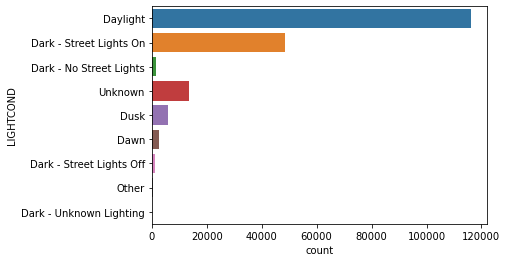

In [7]:
sns.countplot(y=df_accidents['LIGHTCOND'],data=df_accidents)

# 2. Methodology


# 2.1. Identify and handle missing values in the new data frame
The missing values are automatically converted to Python's default (NaN). We use Python's built-in functions, .isnull(), to identify these missing values.

# 2.1.1 Count missing values in each column
By using a for loop in Python, we will figure out the number of missing values in each column. 

In, addition we will also calculate the percentage of missing values for each feature.

Any feature which contains more than (80%) of missing values will be dropped from the dataset.

In [8]:
#Exploratory data analysis
def missing(df_accidents):
    
    # Identify missing values. The missing values are automatically converted to Python's default (NaN)
    missing_data = df_accidents.isnull()
    missing_data.head(5)
    
    # Count the proportion of missing values in each column
    for column in missing_data.columns.values.tolist():
        print(column)
        total_observations = 194673 # total of accidents by using the severity code.
        print (missing_data[column].value_counts()/ total_observations)
        print(df_accidents[column].value_counts())
        print("")   

missing(df_accidents)   

SEVERITYCODE
False    1.0
Name: SEVERITYCODE, dtype: float64
1    136485
2     58188
Name: SEVERITYCODE, dtype: int64

X
False    0.9726
True     0.0274
Name: X, dtype: float64
-122.332653    265
-122.344896    254
-122.328079    252
-122.344997    239
-122.299160    231
              ... 
-122.388694      1
-122.264843      1
-122.316002      1
-122.415912      1
-122.382676      1
Name: X, Length: 23563, dtype: int64

Y
False    0.9726
True     0.0274
Name: Y, dtype: float64
47.708655    265
47.717173    254
47.604161    252
47.725036    239
47.579673    231
            ... 
47.638632      1
47.662634      1
47.674878      1
47.555359      1
47.563521      1
Name: Y, Length: 23839, dtype: int64

INCKEY
False    1.0
Name: INCKEY, dtype: float64
266238    1
81549     1
104088    1
126615    1
124566    1
         ..
164613    1
176899    1
178946    1
172801    1
295445    1
Name: INCKEY, Length: 194673, dtype: int64

ADDRTYPE
False    0.990106
True     0.009894
Name: ADDRTYPE, dtype: 

# 2.1.2 Handle the missing data
As per above, more than 80% of entries for 'INATTENTIONIND'(85%), 'PEDROWNOTGRNT'(98%) and 'SPEEDING'(95%) are empty. Therefore, no meaningful analysis can derived from these features. Consequently we remode these 3 additional features from the dataset.  This leaves 194,673 obersations and 15 features which are:    


*X*: Latitude,

*Y* : Longitude 

*COLLISIONTYPE*: Collision type 

*PERSONCOUNT*: The total number of people involved in the collision 

*PEDCOUNT*: The number of pedestrians involved in the collision. This is entered by the state. 

*PEDCYLCOUNT* : The number of bicycles involved in the collision. This is entered by the state.

*VEHCOUNT* : The number of vehicles involved in the collision. 

*UNDERINFL* : Whether or not a driver involved was under the influence of drugs or alcohol

*JUNCTIONTYPE* : Category of junction at which collision took place

*LOCATION*: Description of the general location of the Collision 

*WEATHER* : A description of the weather conditions during the time of the collision

*ADDRTYPE*: Collision address type (Alley,Block,Intersection)
 
*ROADCOND* : The condition of the road during the collision. 

*LIGHTCOND* : The light conditions during the collision. 

*HITPARKEDCAR* : Whether or not the collision involved hitting a parked car. (Y/N)
     

These these variables are categorical variables.Thefore it seems to be reasonable to replace the missing values by the frequency value of each column.

In [9]:
#Removing features which contains more than 80% missing values (INATTENTIONIND,PEDROWNOTGRNT,SPEEDING)
df_accidents.drop(["INATTENTIONIND","PEDROWNOTGRNT","SPEEDING"],axis=1, inplace =True)


In [10]:
df_accidents.columns.values

array(['SEVERITYCODE', 'X', 'Y', 'INCKEY', 'ADDRTYPE', 'LOCATION',
       'COLLISIONTYPE', 'PERSONCOUNT', 'PEDCOUNT', 'PEDCYLCOUNT',
       'VEHCOUNT', 'JUNCTIONTYPE', 'UNDERINFL', 'WEATHER', 'ROADCOND',
       'LIGHTCOND', 'HITPARKEDCAR'], dtype=object)

In [11]:
print(df_accidents.dtypes)

SEVERITYCODE       int64
X                float64
Y                float64
INCKEY             int64
ADDRTYPE          object
LOCATION          object
COLLISIONTYPE     object
PERSONCOUNT        int64
PEDCOUNT           int64
PEDCYLCOUNT        int64
VEHCOUNT           int64
JUNCTIONTYPE      object
UNDERINFL         object
WEATHER           object
ROADCOND          object
LIGHTCOND         object
HITPARKEDCAR      object
dtype: object


In [12]:
df_accidents['HITPARKEDCAR'].value_counts().to_frame()

,HITPARKEDCAR
N,187457
Y,7216


The dataset is quite challenging. It contains a mixture of categorical values and mumerical values. In addition, some features also contain several values idenfied as "other" "?" and/or "Unknown" etc). Finally, some features are are not consistent as they contain a mixture of numerical and categorical values. To deal with these issue, we proceed in 4 steps:

Step 1 : We replace all values identified as  "other" "?" and/or "unknown" by 'NaN'. 

Step 2: Numerical values - Only 2 numerical variables have missing values. We simply drop the whole row with NaN in "X" and "Y" columns

Step 3 : Categorical variables - For these variables, it seems reasonable to replace the missing value ('NaN') by the column frequency which is the the most common value  in the columns. This is the case for ADDRTYPE, LOCATION, COLLISIONTYPE,JUNCTIONTYPE,INATTENTIONIND,UNDERINF, WEATHER,ROADCOND,LIGHTCOND)

Step 4 : Some features are not consistent as they contain a mixture of numerical and categorical values. We standardise these columns by converting all the numerical values to the categorical ones. This is the case for 'UNDERINFL', where we replace replace 0 with 'N' and 1 with 'Y'. 


In [13]:
df_accidents.describe(include=['object'])

,ADDRTYPE,LOCATION,COLLISIONTYPE,JUNCTIONTYPE,UNDERINFL,WEATHER,ROADCOND,LIGHTCOND,HITPARKEDCAR
count,192747,191996,189769,188344,189789,189592,189661,189503,194673
unique,3,24102,10,7,4,11,9,9,2
top,Block,BATTERY ST TUNNEL NB BETWEEN ALASKAN WY VI NB ...,Parked Car,Mid-Block (not related to intersection),N,Clear,Dry,Daylight,N
freq,126926,276,47987,89800,100274,111135,124510,116137,187457


In [14]:
# Just double check whether frequencies are correct
df_accidents['WEATHER'].value_counts().idxmax()

'Clear'

In [15]:
# 1. Replace all unidenfied values by NaN

df_accidents.replace(r'^\s*$', np.nan, regex=True)
df_accidents.replace("Unknown", np.nan, inplace = True)
df_accidents.replace("Other", np.nan, inplace = True)

# 2. Simply drop whole row with NaN in "X" and "Y" columns
df_accidents.dropna(subset=["X","Y"], axis=0, inplace=True)

# 3. Replace all the NaN by the most common value
df_accidents['ADDRTYPE'].replace(np.nan, "Block", inplace=True)
df_accidents['LOCATION'].replace(np.nan, "BATTERY ST TUNNEL NB BETWEEN ALASKAN WY VI NB AND AURORA AVE N", inplace=True)
df_accidents['COLLISIONTYPE'].replace(np.nan, "Parked Car", inplace=True)
df_accidents['JUNCTIONTYPE'].replace(np.nan, "Mid-Block (not related to intersection)", inplace=True)
df_accidents['UNDERINFL'].replace(np.nan, "N", inplace=True)
df_accidents['WEATHER'].replace(np.nan, "Clear", inplace=True)
df_accidents['ROADCOND'].replace(np.nan, "Dry", inplace=True)
df_accidents['LIGHTCOND'].replace(np.nan, "Daylight", inplace=True)
df_accidents['HITPARKEDCAR'].replace(np.nan, "N", inplace=True)

# 4. Replace replace 0 with 'N' and 1 with 'Y'. 
df_accidents['UNDERINFL'] = df_accidents['UNDERINFL'].replace(['0'],'N')
df_accidents['UNDERINFL'] = df_accidents['UNDERINFL'].replace(['1'],'Y')

# reset index, because we droped 5334 rows for X and Y
df_accidents.reset_index(drop=True, inplace=True)

df_accidents['UNDERINFL'].value_counts()


N    180458
Y      8881
Name: UNDERINFL, dtype: int64

In [16]:
#After dropping 5334 rows from X and Y, the dataset is reduced from 194673 to 189339 observations and columns (including the target column which is severitycode)

print(df_accidents.shape)
A = 194673-5334
A

(189339, 17)


189339

In [17]:
#Checking whether there are no missing values left.
print(df_accidents.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 189339 entries, 0 to 189338
Data columns (total 17 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   SEVERITYCODE   189339 non-null  int64  
 1   X              189339 non-null  float64
 2   Y              189339 non-null  float64
 3   INCKEY         189339 non-null  int64  
 4   ADDRTYPE       189339 non-null  object 
 5   LOCATION       189339 non-null  object 
 6   COLLISIONTYPE  189339 non-null  object 
 7   PERSONCOUNT    189339 non-null  int64  
 8   PEDCOUNT       189339 non-null  int64  
 9   PEDCYLCOUNT    189339 non-null  int64  
 10  VEHCOUNT       189339 non-null  int64  
 11  JUNCTIONTYPE   189339 non-null  object 
 12  UNDERINFL      189339 non-null  object 
 13  WEATHER        189339 non-null  object 
 14  ROADCOND       189339 non-null  object 
 15  LIGHTCOND      189339 non-null  object 
 16  HITPARKEDCAR   189339 non-null  object 
dtypes: float64(2), int64(6), obje

In [18]:
print(df_accidents.shape)

(189339, 17)


In [19]:
#Few sanity checks to ensure there are no 'NaN' or 'Other' left
print(df_accidents.isnull().sum().to_frame())
print('WEATHER Size :', df_accidents["WEATHER"].size)
print('WEATHER_Other_Val :', df_accidents ['WEATHER'] == 'Other')

               0
SEVERITYCODE   0
X              0
Y              0
INCKEY         0
ADDRTYPE       0
LOCATION       0
COLLISIONTYPE  0
PERSONCOUNT    0
PEDCOUNT       0
PEDCYLCOUNT    0
VEHCOUNT       0
JUNCTIONTYPE   0
UNDERINFL      0
WEATHER        0
ROADCOND       0
LIGHTCOND      0
HITPARKEDCAR   0
WEATHER Size : 189339
WEATHER_Other_Val : 0         False
1         False
2         False
3         False
4         False
          ...  
189334    False
189335    False
189336    False
189337    False
189338    False
Name: WEATHER, Length: 189339, dtype: bool


In [20]:
print(df_accidents.shape)

(189339, 17)


In [21]:
# 1. Checking for duplicate values. 
print('Are values unique?',df_accidents.index.is_unique)
# 2. removing duplicates
df_dup = df_accidents.drop_duplicates(inplace=True)


Are values unique? True


In [22]:
# After checking for the duplicates, we end up with 189339 observations.
(df_accidents.shape)

(189339, 17)

# SAVE CLEAN DATA

In [23]:
df_accidents.to_csv('clean_severitycode.csv')

## 2.2  Handle the unbalanced data

The dataset is unbalanced with respect to the target variable (SEVERITICODE) :57118 accidents identified with injury as severity (injury =2), as opposed to 132221 accidents identified with property damage (prop damage = 1). Given the number of class differs drasticallyt this will lead to a biased machine learning model(ML) , in the sense that the data is skewed toward the bigger class (SEVERITY CODE = 1). As such the ML won’t be able to learn the minority class, in this instance SEVERITYCODE = 2. To handle this issue, we will generated a balanced dataset.

In [24]:
print(df_accidents['SEVERITYCODE'].value_counts())


1    132221
2     57118
Name: SEVERITYCODE, dtype: int64


<AxesSubplot:xlabel='SEVERITYCODE', ylabel='count'>

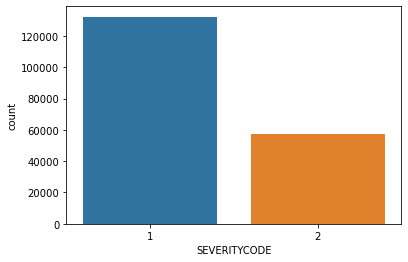

In [25]:
sns.countplot(x=df_accidents['SEVERITYCODE'],data=df_accidents)

In [26]:
# using resample function from sklearn to generate the balanced dataset
from sklearn.utils import resample

# Defining Majority Class
df_severitycode1 = df_accidents.loc[df_accidents['SEVERITYCODE'] == 1]

# Defining Minority Class
df_severitycode2 = df_accidents.loc[df_accidents['SEVERITYCODE'] == 2]

#Unndersample majority class

df_severitycode1  = resample(df_severitycode1, 
                                 replace=True,     
                                 n_samples= 57118,    
                                 random_state=42) 
                          
                              
# Step 3 - Combine minority class with undersampled majority class by using concatenate function in order to get the balanced dataset
                                 
df_bal =pd.concat([df_severitycode1,df_severitycode2])
                                 
#Display new balanced class count
df_bal['SEVERITYCODE'].value_counts()

2    57118
1    57118
Name: SEVERITYCODE, dtype: int64

Let's generate the Seattle in order to view the concentration of accident  

1 - *Group* by to see concentration of accident  

2- Generate Seattle Map

First, we will determine the areas with the highest concentration of accident by installing conda-forge folium to generate a graphical representation of Seattle  Choropleth map.

Second, we will will investigate the accident severity causes by looking at different features associated with the accident severity in those areas.

## Creating Choropleth map

In [27]:
!conda install -c conda-forge folium=0.5.0 --yes
import folium

print('Folium installed and imported!')

Solving environment: done

# All requested packages already installed.

Folium installed and imported!


In [28]:
# 3. create a plain seattle map
seattle_map = folium.Map(location=[47.608013, -122.335167], zoom_start=10)

# get the first 10000 accdients in the df_bal dataframe
limit = 10000
df_map = df_bal.iloc[0:limit, :]

df_map.shape

(10000, 17)

In [29]:
# Convert Severity into string in order to read it
df_map[["SEVERITYCODE"]] = df_map[["SEVERITYCODE"]].astype("str")
df_map.dtypes

/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/pandas/core/frame.py:3065: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[k1] = value[k2]


SEVERITYCODE      object
X                float64
Y                float64
INCKEY             int64
ADDRTYPE          object
LOCATION          object
COLLISIONTYPE     object
PERSONCOUNT        int64
PEDCOUNT           int64
PEDCYLCOUNT        int64
VEHCOUNT           int64
JUNCTIONTYPE      object
UNDERINFL         object
WEATHER           object
ROADCOND          object
LIGHTCOND         object
HITPARKEDCAR      object
dtype: object

In [30]:
from folium import plugins

#  clean copy of the map of Seattle
seattle_map = folium.Map(location=[47.608013, -122.335167], zoom_start=15)

# instantiate a mark cluster object for the incidents in the dataframe
accidents = plugins.MarkerCluster().add_to(seattle_map)

# loop through the dataframe and add each data point to the mark cluster
for lat, lng, label, in zip(df_map.Y, df_map.X, df_map.SEVERITYCODE):
    folium.Marker(
        location=[lat, lng],
        icon=None,
        popup=label,
    ).add_to(accidents)

# display map
seattle_map

In [31]:

seattle_map
seattle_map.save("seattlemap.html")


In [32]:
# Looking at concentration of accident per location
top_10 = df_bal['LOCATION'].value_counts().to_frame()
df_weather = top_10.head(5)
df_weather

,LOCATION
AURORA AVE N BETWEEN N 117TH PL AND N 125TH ST,186
6TH AVE AND JAMES ST,165
AURORA AVE N BETWEEN N 130TH ST AND N 135TH ST,163
N NORTHGATE WAY BETWEEN MERIDIAN AVE N AND CORLISS AVE N,157
RAINIER AVE S BETWEEN S BAYVIEW ST AND S MCCLELLAN ST,155


In [33]:
# Causes of accident for these locations

df_gp = df_bal[['X','Y','SEVERITYCODE','VEHCOUNT','WEATHER','ROADCOND','LIGHTCOND','LOCATION']]    
acc_cause = df_gp.groupby(['SEVERITYCODE','WEATHER','ROADCOND','LIGHTCOND','LOCATION'],as_index=False).count()
acc_cause

,SEVERITYCODE,WEATHER,ROADCOND,LIGHTCOND,LOCATION,X,Y,VEHCOUNT
0,1,Blowing Sand/Dirt,Dry,Daylight,47TH AVE SW BETWEEN SW ADMIRAL WAY AND SW LAND...,1,1,1
1,1,Blowing Sand/Dirt,Dry,Daylight,LEARY WAY NW BETWEEN NW 46TH ST AND NW BALLARD...,1,1,1
2,1,Blowing Sand/Dirt,Ice,Daylight,35TH AVE SW BETWEEN SW HUDSON ST AND SW DAWSON ST,1,1,1
3,1,Clear,Dry,Dark - No Street Lights,10TH AVE E BETWEEN E ALOHA ST AND E PROSPECT ST,1,1,1
4,1,Clear,Dry,Dark - No Street Lights,11TH AVE E BETWEEN E REPUBLICAN ST AND E MERCE...,1,1,1
...,...,...,...,...,...,...,...,...
60437,2,Snowing,Wet,Daylight,OLSON PL SW BETWEEN 3RD AVE SW AND SW CAMBRIDG...,1,1,1
60438,2,Snowing,Wet,Daylight,STONE AVE N AND N 125TH ST,1,1,1
60439,2,Snowing,Wet,Dusk,GREENWOOD AVE N AND N 80TH ST,1,1,1
60440,2,Snowing,Wet,Dusk,N NORTHGATE WAY BETWEEN CORLISS AVE N AND 1ST ...,1,1,1


In [34]:
# Top 10 accident severity causes for the above areas
acc_cause.sort_values(by = 'VEHCOUNT', ascending = False, axis = 0, inplace = True)
acc_cause.head(5)

,SEVERITYCODE,WEATHER,ROADCOND,LIGHTCOND,LOCATION,X,Y,VEHCOUNT
38453,2,Clear,Dry,Daylight,AURORA AVE N BETWEEN N 117TH PL AND N 125TH ST,58,58,58
41141,2,Clear,Dry,Daylight,N NORTHGATE WAY BETWEEN MERIDIAN AVE N AND COR...,50,50,50
38457,2,Clear,Dry,Daylight,AURORA AVE N BETWEEN N 130TH ST AND N 135TH ST,48,48,48
41922,2,Clear,Dry,Daylight,RAINIER AVE S BETWEEN S BAYVIEW ST AND S MCCLE...,42,42,42
41884,2,Clear,Dry,Daylight,RAINIER AVE S AND S ORCAS ST,42,42,42


In [35]:
# Other factors caussing accident

df1 =df_bal.groupby(['SEVERITYCODE','ADDRTYPE','JUNCTIONTYPE','WEATHER','ROADCOND','LIGHTCOND'], as_index = False)['INCKEY'].count()
df1


,SEVERITYCODE,ADDRTYPE,JUNCTIONTYPE,WEATHER,ROADCOND,LIGHTCOND,INCKEY
0,1,Block,At Intersection (intersection related),Clear,Dry,Daylight,1
1,1,Block,Driveway Junction,Clear,Dry,Dark - No Street Lights,8
2,1,Block,Driveway Junction,Clear,Dry,Dark - Street Lights Off,6
3,1,Block,Driveway Junction,Clear,Dry,Dark - Street Lights On,339
4,1,Block,Driveway Junction,Clear,Dry,Dawn,10
...,...,...,...,...,...,...,...
741,2,Intersection,Mid-Block (not related to intersection),Raining,Wet,Daylight,3
742,2,Intersection,Ramp Junction,Clear,Dry,Daylight,6
743,2,Intersection,Ramp Junction,Overcast,Wet,Daylight,1
744,2,Intersection,Ramp Junction,Raining,Wet,Dark - Street Lights On,1


In [36]:
# Junction type
df1.sort_values(by = 'INCKEY', ascending = False, axis = 0, inplace = True)
df1.head(10)

,SEVERITYCODE,ADDRTYPE,JUNCTIONTYPE,WEATHER,ROADCOND,LIGHTCOND,INCKEY
127,1,Block,Mid-Block (not related to intersection),Clear,Dry,Daylight,16318
643,2,Intersection,At Intersection (intersection related),Clear,Dry,Daylight,12744
489,2,Block,Mid-Block (not related to intersection),Clear,Dry,Daylight,8821
279,1,Intersection,At Intersection (intersection related),Clear,Dry,Daylight,7065
125,1,Block,Mid-Block (not related to intersection),Clear,Dry,Dark - Street Lights On,4475
420,2,Block,Mid-Block (but intersection related),Clear,Dry,Daylight,3409
640,2,Intersection,At Intersection (intersection related),Clear,Dry,Dark - Street Lights On,3315
53,1,Block,Mid-Block (but intersection related),Clear,Dry,Daylight,3057
711,2,Intersection,At Intersection (intersection related),Raining,Wet,Daylight,2726
486,2,Block,Mid-Block (not related to intersection),Clear,Dry,Dark - Street Lights On,2557


# Feature Selection:
We're going to develop a model by using these variables: 'SEVERITYCODE'(Target), 'X','Y','INCKEY','VEHCOUNT','ADDRTYPE','WEATHER','JUNCTIONTYPE','ROADCOND','LIGHTCOND') as the predictor variables. 


In [37]:
# Let's drop the following variables as we don't need them the machine learning models.
df_bal.drop(["LOCATION","PEDCOUNT","PEDCYLCOUNT"],axis=1, inplace =True)

In [38]:
print(df_bal.dtypes)

SEVERITYCODE       int64
X                float64
Y                float64
INCKEY             int64
ADDRTYPE          object
COLLISIONTYPE     object
PERSONCOUNT        int64
VEHCOUNT           int64
JUNCTIONTYPE      object
UNDERINFL         object
WEATHER           object
ROADCOND          object
LIGHTCOND         object
HITPARKEDCAR      object
dtype: object


 In this section, we will separate the Target variable (SEVERITYCODE) from the the feature X . In addition, we will convert the categorical values to numerical by using the get_dummies function from pandas.

In [39]:
X = df_bal.iloc[:,1:]

#Encoding Categorical Features - Training Dataset
X = pd.get_dummies(data=X, columns=['ADDRTYPE','WEATHER','JUNCTIONTYPE','ROADCOND','LIGHTCOND','UNDERINFL','HITPARKEDCAR','COLLISIONTYPE'])


X =X.astype(int)



# let's convert Severity Code prop damage = 1 (majority class) and injury =2 (minority class) respectively to 0 and 1

from sklearn import preprocessing
Y = df_bal['SEVERITYCODE'].values

labels = preprocessing.LabelEncoder()
labels.fit([1, 2])
Y = labels.transform (Y)

df_bal ["SEVERITYCODE"] = Y
df_bal['SEVERITYCODE'].value_counts()


# Reshape Y in order to get it behaved consistently as a row vector for the neural network that will be implemetnted later
m = Y.shape[0]
Y= Y.reshape(m,1)

# Finally, let's randomly split the balanced data dataset into training and testing data using the function train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=4)

print(X.info())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 114236 entries, 174069 to 189337
Data columns (total 49 columns):
 #   Column                                                          Non-Null Count   Dtype
---  ------                                                          --------------   -----
 0   X                                                               114236 non-null  int64
 1   Y                                                               114236 non-null  int64
 2   INCKEY                                                          114236 non-null  int64
 3   PERSONCOUNT                                                     114236 non-null  int64
 4   VEHCOUNT                                                        114236 non-null  int64
 5   ADDRTYPE_Block                                                  114236 non-null  int64
 6   ADDRTYPE_Intersection                                           114236 non-null  int64
 7   WEATHER_Blowing Sand/Dirt                          

In [40]:
# normalizing train and test data data
scaler = StandardScaler()
X_train[['X','Y','INCKEY','VEHCOUNT','PERSONCOUNT']] = scaler.fit_transform(
    X_train[['X','Y','INCKEY','VEHCOUNT','PERSONCOUNT']])


scaler = StandardScaler()
X_test[['X','Y','INCKEY','VEHCOUNT','PERSONCOUNT']] = scaler.fit_transform(
    X_test[['X','Y','INCKEY','VEHCOUNT','PERSONCOUNT']])

X_train.info()

/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/sklearn/preprocessing/data.py:625: DataConversionWarning: Data with input dtype int64 were all converted to float64 by StandardScaler.
  return self.partial_fit(X, y)
/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/sklearn/base.py:462: DataConversionWarning: Data with input dtype int64 were all converted to float64 by StandardScaler.
  return self.fit(X, **fit_params).transform(X)
/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.
/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/pandas/core/indexing.py:1736: SettingWithCopyWarning: 
A va

<class 'pandas.core.frame.DataFrame'>
Int64Index: 91388 entries, 90949 to 89014
Data columns (total 49 columns):
 #   Column                                                          Non-Null Count  Dtype  
---  ------                                                          --------------  -----  
 0   X                                                               91388 non-null  float64
 1   Y                                                               91388 non-null  float64
 2   INCKEY                                                          91388 non-null  float64
 3   PERSONCOUNT                                                     91388 non-null  float64
 4   VEHCOUNT                                                        91388 non-null  float64
 5   ADDRTYPE_Block                                                  91388 non-null  int64  
 6   ADDRTYPE_Intersection                                           91388 non-null  int64  
 7   WEATHER_Blowing Sand/Dirt                    

/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/sklearn/preprocessing/data.py:625: DataConversionWarning: Data with input dtype int64 were all converted to float64 by StandardScaler.
  return self.partial_fit(X, y)
/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/sklearn/base.py:462: DataConversionWarning: Data with input dtype int64 were all converted to float64 by StandardScaler.
  return self.fit(X, **fit_params).transform(X)
/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if __name__ == '__main__':
/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/pandas/core/indexing.py:1736: SettingWithCopyWarning: 
A value is tryi

In [41]:
X = StandardScaler().fit(X).transform(X.astype(float))
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=4)
print('X_train:', X_train.shape, ' Y_train:', Y_train.shape, ' and X_test:', X_test.shape)


/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/sklearn/preprocessing/data.py:625: DataConversionWarning: Data with input dtype int64 were all converted to float64 by StandardScaler.
  return self.partial_fit(X, y)


X_train: (91388, 49)  Y_train: (91388, 1)  and X_test: (22848, 49)


# Logistic Regression

In [42]:
# #Lets first see how logistic regression performs on this problem

clf = LogisticRegression(solver='lbfgs', max_iter=400).fit(X,Y)
clf.predict(X)
clf.predict_proba(X)
print('Score on the dataset:', clf.score(X,Y))

#Training the Logistic Model
clf.fit(X_train, Y_train)
clf.score(X_train, Y_train)
print('Score on the training:', clf.score(X_train, Y_train))

#Predicting the Test Set Result
y_pred = clf.predict(X_test)
print(y_pred)

#Using Y_test (actual result) and y_pred to test the model accuracy Create and Confusion Matrix for Evaluation

cm = confusion_matrix(Y_test, y_pred)
print(cm)

# evaluating the model performance for the 2 classes (1 and 0)
print(classification_report(Y_test, y_pred))

#Accuracy
model_accuracy = accuracy_score(Y_test,y_pred)
print(model_accuracy,'\n')

/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/sklearn/utils/validation.py:761: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Score on the dataset: 0.7017227493959872


/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/sklearn/utils/validation.py:761: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Score on the training: 0.7018317503392131
[0 1 1 ... 0 1 1]
[[7373 4133]
 [2690 8652]]
              precision    recall  f1-score   support

           0       0.73      0.64      0.68     11506
           1       0.68      0.76      0.72     11342

   micro avg       0.70      0.70      0.70     22848
   macro avg       0.70      0.70      0.70     22848
weighted avg       0.70      0.70      0.70     22848

0.701374299719888 



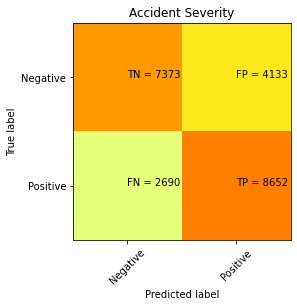

In [43]:
plt.clf()
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Wistia)
classNames = ['Negative','Positive']
plt.title('Accident Severity')
plt.ylabel('True label')
plt.xlabel('Predicted label')
tick_marks = np.arange(len(classNames))
plt.xticks(tick_marks, classNames, rotation=45)
plt.yticks(tick_marks, classNames)
s = [['TN','FP'], ['FN', 'TP']]
for i in range(2):
    for j in range(2):
        plt.text(j,i, str(s[i][j])+" = "+str(cm[i][j]))
plt.show()


# Logistic Regression Evaluation, by plotting actual values against prediction

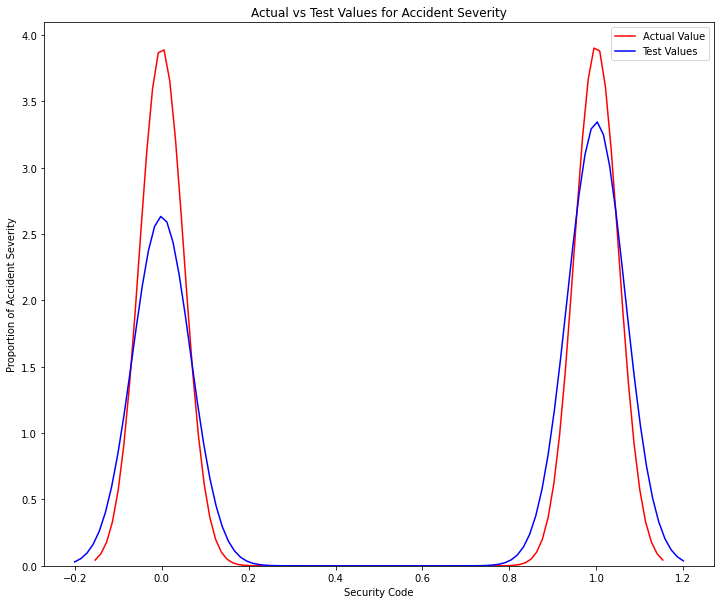

In [44]:
width = 12
height = 10

plt.figure(figsize=(width, height))


ax1 = sns.distplot(Y_train, hist=False, color="r", label="Actual Value")
sns.distplot(y_pred , hist=False, color="b", label="Test Values" , ax=ax1)


plt.title('Actual vs Test Values for Accident Severity')
plt.xlabel('Security Code')
plt.ylabel('Proportion of Accident Severity')

plt.show()
plt.close()

# Decision Tree

In [45]:
#Training the Logistic Model
dtclf = DecisionTreeClassifier(criterion="entropy", max_depth=6)
params = {'criterion':['gini', 'entropy'], 
          'random_state':[42]}
dtclf1 = GridSearchCV(dtclf, param_grid=params)
dtclf1.fit(X_train,Y_train)

print('Best Hyperparameter Decision Tree : ',dtclf1.best_params_)

#Predicting the Test Set Result
pred =  dtclf1.predict(X_test)
print(pred)


#Using Y_test (actual result) and y_pred to test the model accuracy Create and Confusion Matrix for Evaluation

cm = confusion_matrix(Y_test, pred)
print(cm)

# evaluating the model performance for the 2 classes (1 and 0)
print(classification_report(Y_test, pred))

#Accuracy
model_accuracy = accuracy_score(Y_test,pred)
print(model_accuracy,'\n')




/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/sklearn/model_selection/_split.py:2053: FutureWarning: You should specify a value for 'cv' instead of relying on the default value. The default value will change from 3 to 5 in version 0.22.
  warnings.warn(CV_WARNING, FutureWarning)


Best Hyperparameter Decision Tree :  {'criterion': 'entropy', 'random_state': 42}
[0 1 1 ... 1 1 1]
[[6801 4705]
 [2073 9269]]
              precision    recall  f1-score   support

           0       0.77      0.59      0.67     11506
           1       0.66      0.82      0.73     11342

   micro avg       0.70      0.70      0.70     22848
   macro avg       0.71      0.70      0.70     22848
weighted avg       0.72      0.70      0.70     22848

0.7033438375350141 



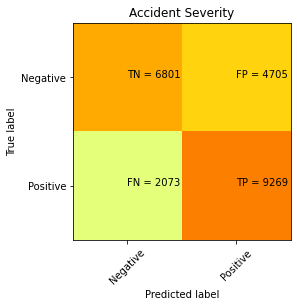

In [46]:
plt.clf()
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Wistia)
classNames = ['Negative','Positive']
plt.title('Accident Severity')
plt.ylabel('True label')
plt.xlabel('Predicted label')
tick_marks = np.arange(len(classNames))
plt.xticks(tick_marks, classNames, rotation=45)
plt.yticks(tick_marks, classNames)
s = [['TN','FP'], ['FN', 'TP']]
for i in range(2):
    for j in range(2):
        plt.text(j,i, str(s[i][j])+" = "+str(cm[i][j]))
plt.show()

# Deep Neural Network 

In [47]:
X = X.T
m = X.shape[1] 

Y = df_bal['SEVERITYCODE'].values
Y = Y.reshape(m,1)
Y = Y.T


X_train = X_train.T
Y_train = Y_train.T

X_test = X_test.T
Y_test = Y_test.T


print ('I have m = %d training examples!' % (m))

# Defining layers' size
# NEURAL NETWORK STRUCTURE : 2 layers. hidden layer sizes = 2 neurons. Output layer size = 1 neuron

def layer_sizes(X, Y):
    
   
   
    n_x = X.shape[0] # size of input layer
    n_h = 2
    n_y = Y.shape[0] # size of output layer
    
   
    return (n_x, n_h, n_y)
    
    

(n_x, n_h, n_y) = layer_sizes(X, Y)
print("The size of the input layer is: n_x = " + str(n_x))
print("The size of the hidden layer is: n_h = " + str(n_h))
print("The size of the output layer is: n_y = " + str(n_y))


I have m = 114236 training examples!
The size of the input layer is: n_x = 49
The size of the hidden layer is: n_h = 2
The size of the output layer is: n_y = 1


In [48]:
# initialize_parameters

def initialize_parameters(n_x, n_h, n_y):
    
    
    n_x = X.shape[0]
    n_h = 2
    n_y = 1
    
    np.random.seed(1)
    
    
    W1 = np.random.randn(n_h, n_x)*np.sqrt(2./n_x)
    b1 = np.zeros((n_h, 1))
    W2 = np.random.randn(n_y, n_h)* np.sqrt(2./n_x)
    b2 = np.zeros((n_y, 1))
        
    
    
    assert (W1.shape == (n_h, n_x))
    assert (b1.shape == (n_h, 1))
    assert (W2.shape == (n_y, n_h))
    assert (b2.shape == (n_y, 1))
 
    
    parameters = {"W1": W1,
                  "b1": b1,
                  "W2": W2,
                  "b2": b2}
    
    return parameters   

In [49]:
parameters = initialize_parameters(n_x, n_h, n_y)
print("W1 = " + str(parameters["W1"]))
print("b1 = " + str(parameters["b1"]))
print("W2 = " + str(parameters["W2"]))
print("b2 = " + str(parameters["b2"]))

print(parameters["W1"].shape)
print(parameters["b1"].shape)

W1 = [[ 0.32816732 -0.12359346 -0.10670681 -0.2167724   0.17483874 -0.46498103
   0.35250521 -0.15378702  0.06445563 -0.05038042  0.29539041 -0.41621128
  -0.06513811 -0.0775907   0.22905602 -0.22221159 -0.03483576 -0.17735418
   0.00852846  0.11774645 -0.22235865  0.23126911  0.18214883  0.10151919
   0.18200039 -0.13813389 -0.02482757 -0.18905398 -0.05412157  0.10714798
  -0.13973657 -0.08015632 -0.13882985 -0.17075733 -0.1356122  -0.00255864
  -0.22573078  0.04735912  0.33533068  0.14991556 -0.03875663 -0.17932813
  -0.15094877  0.34192746  0.01026472 -0.12869255  0.03857075  0.42431561
   0.02427577]
 [ 0.12469386  0.06064356 -0.07116522 -0.23082353 -0.07057789 -0.04220301
   0.11851578  0.16950025  0.18811103  0.05769735  0.17882552 -0.1524114
   0.25311759  0.10362747 -0.06022385  0.09869557 -0.01526779  0.22862366
   0.30704936  0.44155291 -0.28213487 -0.29175505 -0.1019175   0.03233237
   0.17701285  0.06376789 -0.40854634 -0.06186255  0.16727614  0.04648616
   0.15394951 -0.04

In [50]:
def sigmoid(z):
    

    
    s = 1/(1+np.exp(-z))
   
    
    return s

In [51]:
print ("sigmoid([0, 2]) = " + str(sigmoid(np.array([0,2]))))

sigmoid([0, 2]) = [0.5        0.88079708]


In [52]:
def forward_propagation(X, parameters):

    # Retrieve each parameter from the dictionary "parameters"
   
    W1 = parameters['W1']
    b1 = parameters['b1']
    W2 = parameters['W2']
    b2 = parameters['b2']
    
    
    # Implement Forward Propagation to calculate A2 (probabilities)
    
    Z1 = (np.dot(W1, X) + b1)
    A1 = np.maximum(0,Z1)

    Z2 = (np.dot(W2, A1) + b2)
    A2 = sigmoid(Z2)

    
    assert(A1.shape == Z1.shape)
    assert(A2.shape == (1, X.shape[1]))
    
    cache = {"Z1": Z1,
             "A1": A1,
             "Z2": Z2,
             "A2": A2}
    
    return A2, cache

In [53]:
A2, cache = forward_propagation(X, parameters)

 
print(np.mean(cache['Z1']) ,np.mean(cache['A1']),np.mean(cache['Z2']),np.mean(cache['A2']))


-2.8736190335898164e-17 0.5029922083321051 0.010388618314304357 0.5026322939793422


In [54]:
def compute_cost(A2, Y, parameters):
        
    m = X.shape[1] # number of example
    
    # Compute the cross-entropy cost
    
    logprobs = np.multiply(np.log(A2),Y)+ np.multiply((1-Y),np.log(1-A2))
    cost = - np.sum(logprobs)/m
    
    
    cost = float(np.squeeze(cost))   
                                     
    assert(isinstance(cost, float))
    
    return cost

In [55]:
cost = compute_cost(A2, Y, parameters)

print("cost = " + str(compute_cost(A2, Y, parameters)))

cost = 0.6897537838604639


In [56]:
#  backward_propagation

def backward_propagation(parameters, cache, X, Y):

    m = X.shape[1]
    
    # First, retrieve W1 and W2 from the dictionary "parameters".
    
    W1 = parameters['W1']
    W2 = parameters['W2']
    
        
    # Retrieve also A1 and A2 from dictionary "cache".
    
    A1 = cache['A1']
    A2 = cache['A2']
    
    
    # Backward propagation: calculate dW1, db1, dW2, db2. 
    
    dZ2 = A2-Y
    dW2 = 1/m*np.dot(dZ2,A1.T)
    db2 = 1/m*np.sum(dZ2, axis = 1, keepdims = True)
    dZ1 = np.dot(W2.T,dZ2)*(A1>0)*1
    
    dW1 = 1/m*np.dot(dZ1,X.T)
    db1 = 1/m*np.sum(dZ1, axis = 1, keepdims = True)
    
    
    grads = {"dW1": dW1,
             "db1": db1,
             "dW2": dW2,
             "db2": db2}
    
    return grads

In [57]:
grads = backward_propagation(parameters, cache, X, Y)
print ("dW1 = "+ str(grads["dW1"]))
print ("db1 = "+ str(grads["db1"]))
print ("dW2 = "+ str(grads["dW2"]))
print ("db2 = "+ str(grads["db2"]))

dW1 = [[ 0.00000000e+00  0.00000000e+00  2.58341605e-04  3.33854475e-03
   1.92451005e-04 -6.78839166e-03  6.78839166e-03 -5.20939749e-05
   1.37089410e-03 -1.42897851e-04 -1.23256238e-04 -2.25560693e-05
  -1.51695002e-03 -4.69562578e-05  3.17871656e-04 -3.21107153e-04
  -3.63977091e-04  6.95995291e-03 -1.40947845e-03 -1.88331355e-03
  -4.84833706e-03  8.59821080e-04  1.57232866e-03 -9.58966193e-04
  -2.21852393e-04 -8.83412342e-05 -2.84432068e-04 -1.21064928e-04
  -1.36167760e-03 -1.00384950e-03 -3.09728106e-04 -1.62698747e-05
  -3.18995179e-05 -3.81230758e-04  3.01581347e-04  1.04442957e-04
  -1.95433274e-03  1.95433274e-03  7.87098805e-04 -7.87098805e-04
   3.14238887e-03  9.80599167e-04 -4.64813352e-04  4.28092043e-03
  -6.14996804e-03  5.07863916e-03  1.21252154e-03 -8.15187170e-04
  -4.39239833e-03]
 [ 0.00000000e+00  0.00000000e+00 -7.41060518e-04 -2.38196728e-03
   4.38657727e-03  8.07852663e-03 -8.07852663e-03  1.67384461e-04
   8.23302880e-05  3.67830474e-05 -5.44783627e-04  

In [58]:
#  update_parameters

def update_parameters(parameters, grads, learning_rate = 0.00006):

    # Retrieve each parameter from the dictionary "parameters"
    
    W1 = parameters['W1']
    b1 = parameters['b1']
    W2 = parameters['W2']
    b2 = parameters['b2']
    
    
    # Retrieve each gradient from the dictionary "grads"
    
    dW1 = grads['dW1']
    db1 = grads['db1']
    dW2 = grads['dW2']
    db2 = grads['db2']
    
    
    # Update rule for each parameter
    
    W1 = W1-learning_rate*dW1
    b1 = b1-learning_rate*db1
    W2 = W2-learning_rate*dW2
    b2 = b2-learning_rate*db2
    
    
    parameters = {"W1": W1,
                  "b1": b1,
                  "W2": W2,
                  "b2": b2}
    
    return parameters

In [59]:
parameters = update_parameters(parameters, grads)

print("W1 = " + str(parameters["W1"]))
print("b1 = " + str(parameters["b1"]))
print("W2 = " + str(parameters["W2"]))
print("b2 = " + str(parameters["b2"]))

W1 = [[ 0.32816732 -0.12359346 -0.10670682 -0.2167726   0.17483873 -0.46498063
   0.3525048  -0.15378701  0.06445555 -0.05038042  0.29539042 -0.41621127
  -0.06513802 -0.07759069  0.229056   -0.22221157 -0.03483574 -0.1773546
   0.00852855  0.11774657 -0.22235836  0.23126906  0.18214874  0.10151924
   0.1820004  -0.13813388 -0.02482756 -0.18905397 -0.05412148  0.10714805
  -0.13973656 -0.08015632 -0.13882985 -0.1707573  -0.13561222 -0.00255864
  -0.22573066  0.04735901  0.33533063  0.14991561 -0.03875682 -0.17932819
  -0.15094874  0.34192721  0.01026509 -0.12869286  0.03857068  0.42431566
   0.02427604]
 [ 0.12469386  0.06064356 -0.07116517 -0.23082339 -0.07057815 -0.04220349
   0.11851627  0.16950024  0.18811102  0.05769735  0.17882555 -0.1524114
   0.25311758  0.10362745 -0.06022386  0.09869551 -0.01526781  0.22862415
   0.30704919  0.44155274 -0.28213515 -0.29175506 -0.10191747  0.03233232
   0.17701284  0.06376786 -0.40854637 -0.06186256  0.16727612  0.04648613
   0.15394942 -0.044

In [60]:

def random_mini_batches(X, Y, mini_batch_size = 64, seed = 0):
   
    
    np.random.seed(seed)            
    m = X.shape[1]                  # number of training examples
    mini_batches = []
        
    # Step 1: Shuffle (X, Y)
    permutation = list(np.random.permutation(m))
    shuffled_X = X[:, permutation]
    shuffled_Y = Y[:, permutation].reshape((1,m))
    

    # Step 2: Partition (shuffled_X, shuffled_Y)
    num_complete_minibatches = math.floor(m/mini_batch_size) 
    for k in range(0, num_complete_minibatches):
        
        mini_batch_X = shuffled_X[:, k*mini_batch_size : (k+1)*mini_batch_size]
        mini_batch_Y = shuffled_Y[:, k*mini_batch_size : (k+1)*mini_batch_size]
        
        mini_batch = (mini_batch_X, mini_batch_Y)
        mini_batches.append(mini_batch)
    
    # Handling the end case (last mini-batch < mini_batch_size)
    if m % mini_batch_size != 0:
        
        mini_batch_X = shuffled_X[:, 0: m- (mini_batch_size*math.floor(m/mini_batch_size))]
        mini_batch_Y = shuffled_Y[:, 0: m- (mini_batch_size*math.floor(m/mini_batch_size))]
        
        mini_batch = (mini_batch_X, mini_batch_Y)
        mini_batches.append(mini_batch)
    
    return mini_batches

In [61]:
mini_batches = random_mini_batches(X, Y, mini_batch_size = 64)

print ("shape of the 1st mini_batch_X: " + str(mini_batches[0][0].shape))
print ("shape of the 2nd mini_batch_X: " + str(mini_batches[1][0].shape))
print ("shape of the 3rd mini_batch_X: " + str(mini_batches[2][0].shape))
print ("shape of the 4rd mini_batch_X: " + str(mini_batches[3][0].shape))
print ("shape of the 5th mini_batch_X: " + str(mini_batches[4][0].shape))
print ("shape of the 6th mini_batch_X: " + str(mini_batches[5][0].shape))
print ("shape of the 7th mini_batch_X: " + str(mini_batches[6][0].shape))
print ("shape of the 8th mini_batch_X: " + str(mini_batches[7][0].shape))
print ("shape of the 9th mini_batch_X: " + str(mini_batches[8][0].shape))
print ("shape of the 10th mini_batch_X:" + str(mini_batches[9][0].shape))
print ("shape of the 11th mini_batch_X:" + str(mini_batches[10][0].shape))
print ("shape of the 12th mini_batch_X:" + str(mini_batches[11][0].shape))    
print ("shape of the 1st mini_batch_Y: " + str(mini_batches[0][1].shape))
print ("shape of the 2nd mini_batch_Y: " + str(mini_batches[1][1].shape)) 
print ("shape of the 3rd mini_batch_Y: " + str(mini_batches[2][1].shape))



shape of the 1st mini_batch_X: (49, 64)
shape of the 2nd mini_batch_X: (49, 64)
shape of the 3rd mini_batch_X: (49, 64)
shape of the 4rd mini_batch_X: (49, 64)
shape of the 5th mini_batch_X: (49, 64)
shape of the 6th mini_batch_X: (49, 64)
shape of the 7th mini_batch_X: (49, 64)
shape of the 8th mini_batch_X: (49, 64)
shape of the 9th mini_batch_X: (49, 64)
shape of the 10th mini_batch_X:(49, 64)
shape of the 11th mini_batch_X:(49, 64)
shape of the 12th mini_batch_X:(49, 64)
shape of the 1st mini_batch_Y: (1, 64)
shape of the 2nd mini_batch_Y: (1, 64)
shape of the 3rd mini_batch_Y: (1, 64)


In [62]:
def model(X, Y, n_h, learning_rate = 0.00006, mini_batch_size = 64, num_epochs = 10000, print_cost = False):


    parameters = initialize_parameters(n_x, n_h, n_y)
    W1 = parameters['W1']
    W2 = parameters['W2']
    b1 = parameters['b1']
    b2 = parameters['b2']

    costs = []
    seed = 10 
        
       
    for i in range(0, num_epochs):
       
        # Define the random minibatches. 
        seed = seed + 1
        mini_batches = random_mini_batches(X, Y, mini_batch_size, seed)
        
        for mini_batch in mini_batches:
            # Select a minibatch
            (mini_batch_X, mini_batch_Y)= mini_batch 
            
        
        # Forward propagation. Inputs: "X, parameters". Outputs: "A2, cache".
        A2, cache = forward_propagation(mini_batch_X,parameters)
        
        # Cost function. Inputs: "A2, Y, parameters". Outputs: "cost".
        cost = compute_cost(A2, mini_batch_Y, parameters)
 
        # Backpropagation. Inputs: "parameters, cache, X, Y". Outputs: "grads".
        grads = backward_propagation(parameters, cache, mini_batch_X, mini_batch_Y)
 
        # Gradient descent parameter update. Inputs: "parameters, grads". Outputs: "parameters".
       
        parameters = update_parameters(parameters, grads, learning_rate = 0.00006)
        # Record the costs
        if i % 100 == 0:
            costs.append(cost)
            
      
        # Print the cost every 2000 epoch
        if print_cost and i % 2000 == 0:
            print ("Cost after epoch %i: %f" %(i, cost))
      
   

    # plot the cost
    plt.plot(costs)
    plt.ylabel('cost')
    plt.xlabel('epochs (per 100)')
    plt.title("Learning rate = " + str(learning_rate))
    plt.show()

    

    parameters = {"costs": costs,
         
         "W1" : W1, 
         "W2" : W2,      
         "b1" : b1,
         "b2" : b2,
         "learning_rate" : learning_rate,
         "num_epochs": num_epochs}
    
    return parameters

Cost after epoch 0: 0.000371
Cost after epoch 2000: 0.000353
Cost after epoch 4000: 0.000367
Cost after epoch 6000: 0.000362
Cost after epoch 8000: 0.000359


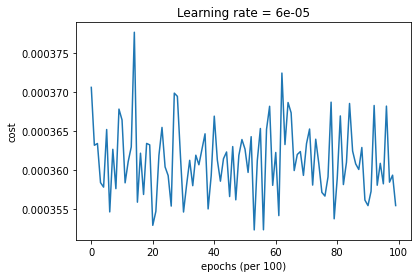

In [63]:
parameters = model(X, Y, 4, num_epochs = 10000,learning_rate = 0.00006, print_cost=True)

In [64]:
def predict(X, Y, parameters):
   
    
    m = X.shape[1]
    p = np.zeros((1,m), dtype = np.int)
    
    # Forward propagation
    A2, caches = forward_propagation(X, parameters)
    
    # convert probas to 0/1 predictions
    for i in range(A2.shape[1]):
        if A2[0,i] > 0.5:
            p[0,i] = 1
        else:
            p[0,i] = 0

    
    # code for single dimension
    print("Accuracy: "  + str(np.mean((p[0] == Y[0]))))
    return p

In [65]:
predictions = predict(X,Y, parameters)
predictions_test = predict(X_test,Y_test, parameters)
print(predictions)
print(predictions_test)

print ('Accuracy_data: %d' % float((np.dot(Y,predictions.T) + np.dot(1-Y,1-predictions.T))/float(Y.size)*100) + '%')
print ('Accuracy_test: %d' % float((np.dot(Y_test,predictions_test.T) + np.dot(1-Y_test,1-predictions_test.T))/float(Y_test.size)*100) + '%')




Accuracy: 0.5954165061801884
Accuracy: 0.5976015406162465
[[1 0 1 ... 0 0 1]]
[[0 0 0 ... 1 0 0]]
Accuracy_data: 59%
Accuracy_test: 59%


In [66]:

predictions_train = predict(X_train, Y_train, parameters)
predictions_test = predict(X_test, Y_test, parameters)

Accuracy: 0.5948702236617499
Accuracy: 0.5976015406162465


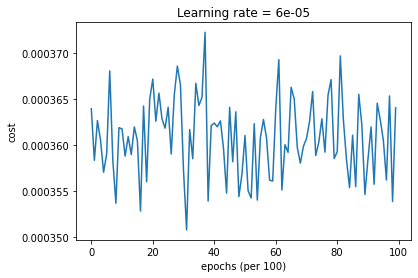

On the train set:
Accuracy: 0.5948702236617499
On the test set:
Accuracy: 0.5976015406162465


In [67]:
parameters = model(X_train, Y_train, n_h,learning_rate = 0.00006, num_epochs=10000)

print ("On the train set:")
predictions_train = predict(X_train, Y_train, parameters)
print ("On the test set:")
predictions_test = predict(X_test, Y_test, parameters)

learning rate is: 0.0001


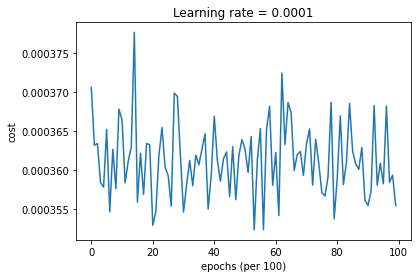


-------------------------------------------------------

learning rate is: 5e-05


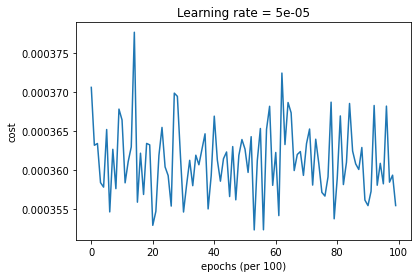


-------------------------------------------------------

learning rate is: 6e-05


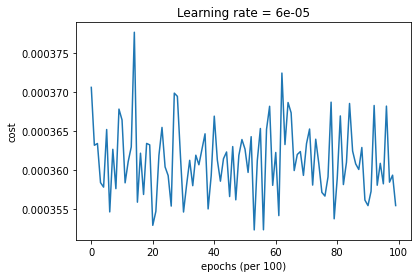


-------------------------------------------------------



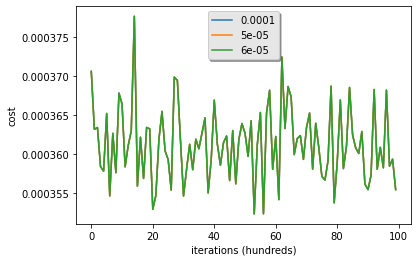

In [68]:
learning_rates = [0.0001, 0.00005, 0.00006]
models = {}
for i in learning_rates:
    print ("learning rate is: " + str(i))
    models[str(i)] = model(X, Y, n_h, learning_rate = i, mini_batch_size = 64, num_epochs = 10000, print_cost = False) 
    print ('\n' + "-------------------------------------------------------" + '\n')

for i in learning_rates:
    plt.plot(np.squeeze(models[str(i)]["costs"]), label= str(models[str(i)]["learning_rate"]))

plt.ylabel('cost')
plt.xlabel('iterations (hundreds)')

legend = plt.legend(loc='upper center', shadow=True)
frame = legend.get_frame()
frame.set_facecolor('0.90')
plt.show()

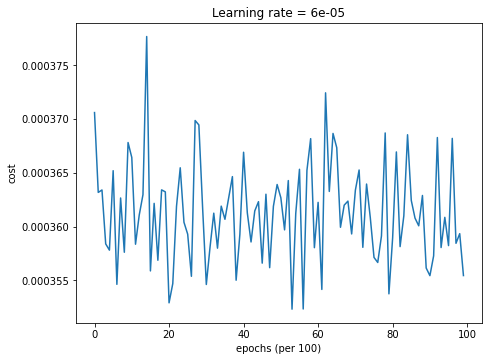

Accuracy: 0.5954165061801884
Accuracy for 1 hidden units: 59.541650618018835 %


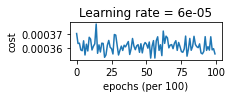

Accuracy: 0.5954165061801884
Accuracy for 2 hidden units: 59.541650618018835 %


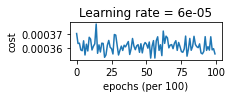

Accuracy: 0.5954165061801884
Accuracy for 3 hidden units: 59.541650618018835 %


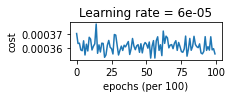

Accuracy: 0.5954165061801884
Accuracy for 4 hidden units: 59.541650618018835 %


In [ ]:

plt.figure(figsize=(16, 32))
hidden_layer_sizes = [1, 2, 3, 4, 5, 20, 50]
for i, n_h in enumerate(hidden_layer_sizes):
    plt.subplot(5, 2, i+1)
    plt.title('Hidden Layer of size %d' % n_h)
    parameters = model(X, Y, n_h, num_epochs=10000)
   
    predictions = predict(X, Y, parameters)
    accuracy = float((np.dot(Y,predictions.T) + np.dot(1-Y,1-predictions.T))/float(Y.size)*100)
    print ("Accuracy for {} hidden units: {} %".format(n_h, accuracy))